<p style="align: center;"><img src="https://static.tildacdn.com/tild6636-3531-4239-b465-376364646465/Deep_Learning_School.png", width=500></p>

<h3 style="text-align: center;"><b>Физтех-Школа Прикладной математики и информатики (ФПМИ) МФТИ</b></h3>

---

---
### This notebook requires a GPU runtime to run.
### Please select the menu option "Runtime" -> "Change runtime type", select "Hardware Accelerator" -> "GPU" and click "SAVE"
---

# <h2 style="text-align: center;"><b>Object detection. Project.</b></h2>

## 2 сценарий

<p style="text-align: center;"><i>Руководитель проекта: Илья Захаркин (Сколтех, МФТИ) | @ilyazakharkin</i></p>
<p style="text-align: center;"><i>Руководитель проекта: Юрий Яровиков (МФТИ) </i></p>

<p style="text-align: center;"><img src="https://miro.medium.com/max/750/1*LTPAzUjUentTWoXXmqoT9g.jpeg"></p>

### <h2 style="text-align: center;"><b>Этапы работы</b></h2>

<h3 style="text-align: center;"><b>Общий этап работы</b></h3>

### **1). Выбор фреймворка/библиотеки для использования детектора**

Чтобы освежить память о задаче детекции можно посмотреть [лекцию этого года](https://www.youtube.com/watch?v=8D01Xo9hWgg&t=10s).

В выборе фреймворка предоставляется свобода, лично я рекомендовал бы один из:
- `torchvision.models.detection` и `torchhub`: "нативные" модели для детектирования прямо из PyTorch. Примеры использования есть прямо на занятиях DLSchool по практике CV [2019 года](https://www.youtube.com/watch?v=XSPYe4-y4HE) и [2020 года](https://www.youtube.com/watch?v=JX6N74K84n0);
- `mmdetection`: как с ним работать рассказывается в [практическом занятии 2020 года](https://www.youtube.com/watch?v=gw_IXcbhOO0).
- `detectron2`: краткая информация есть в конце [занятия DLSchool по практике CV](https://www.youtube.com/watch?v=XSPYe4-y4HE), можно начать с него. Лучше самостоятелньо изучить [официальный репозиторий](https://github.com/facebookresearch/detectron2) и уже с ним работать в дальнейшем ("Quick Start");
- `TensorFlow Object Detection API`: как с ним работать рассказывается в [занятии 2018 года](https://www.youtube.com/watch?v=xHIzyrU1uVM). Работать предстоит с [официальным репозиторием](https://github.com/tensorflow/models/tree/master/research/object_detection).

Рекомендую выбрать один из них и работать уже с этим модулем.

> Результатом пункта является зафиксированный фреймворк для нейросети-детектора.

Для своего проекта я выбрала фреймворк [**mmdetection**](https://github.com/open-mmlab/mmdetection)

## Импорт MMDetection

Установим mmdetection

In [1]:
%%time
# install mmcv-full
!pip install mmcv-full

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

     |████████████████████████████████| 317kB 6.3MB/s 
     |████████████████████████████████| 194kB 9.0MB/s 
  Created wheel for mmcv-full: filename=mmcv_full-1.3.7-cp37-cp37m-linux_x86_64.whl size=29432534 sha256=73b637805615f46a44c07862262dccc89465d8a26592ed0df768e6d659197544
  Stored in directory: /root/.cache/pip/wheels/d5/6d/0d/ddcbe32bbab2e52827d8cc7bfbfa988a89329fca62d5d87b03
Successfully built mmcv-full
Cloning into 'mmdetection'...
remote: Enumerating objects: 18482, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 18482 (delta 12), reused 14 (delta 4), pack-reused 18449
Receiving objects: 100% (18482/18482), 21.57 MiB | 25.80 MiB/s, done.
Resolving deltas: 100% (12907/12907), done.
/content/mmdetection
Obtaining file:///content/mmdetection
  Created wheel for terminaltables: filename=terminaltables-3.1.0-cp37-none-any.whl size=15356 sha256=4d82f433958afe88c5b741422100e3e77348bd4208c79f6c26ff933652a985e6
  Stor

In [3]:
# Check Pytorch installation
import torch, torchvision
print('Версия torch ', torch.__version__)
print('Версия torchvision ', torchvision.__version__)

# Check MMDetection installation
from mmdetection import mmdet
print('Версия mmdet ', mmdet.__version__)

# Check mmcv installation
import mmcv
print('Версия mmcv ', mmcv.__version__)
from mmcv.ops import get_compiling_cuda_version
print('Версия cuda ', get_compiling_cuda_version())

Версия torch  1.9.0+cu102
Версия torchvision  0.10.0+cu102
Версия mmdet  2.13.0
Версия mmcv  1.3.7
Версия cuda  11.0


Выберем модель, которую будем обучать на нашем датасете. MMDetection предоставляет широкий выбор моделей. Я выбирала среди этих моделей:
- [CenterNet](https://github.com/open-mmlab/mmdetection/blob/master/configs/centernet/README.md)
- [AutoAssign](https://github.com/open-mmlab/mmdetection/blob/master/configs/autoassign/README.md)
- [Dynamic R-CNN](https://github.com/open-mmlab/mmdetection/tree/master/configs/dynamic_rcnn)
- [PointRend](https://github.com/open-mmlab/mmdetection/tree/master/configs/point_rend)
- [ATSS](https://github.com/open-mmlab/mmdetection/tree/master/configs/atss)

Для своей работы я выбирала модель, которая может быть адаптирована для детекции на видео, т.е. весит немного, и дает неплохое качество предсказаний.

Полноценное сравнение качества предсказаний моделей заслуживает отдельной работы, которая останется за рамками данного проекта.\
 Я сравнила предсказания моделей на demo-изображении в папке demo библиотеки mmdetection.
- Уверенную победу я отдам PointRend за уверенное качество предсказаний объектов на изображении. Однако это довольно тяжеловесная модель. 241Мб.
- ATSS показало хуже качество, чем CenterNet, при существенно большем весе (129Mb против 58Mb).
- AutoAssign и Dynamic R-CNN показывают сопоставимое качество, но некоторые объекты определяют уверенно некорректно (лавку на заднем фоне, как стул). AutoAssign весит чуть меньше (146Mb и 167Mb соответственно).
- CenterNet делает неуверенные предсказания даже для центрального изображения, однако она делает верные предсказания для далеких объектов и корректно предсказывает объекты, на которых ошиблись предыдущие 2 модели. Кроме того, CenterNet имеет существенно меньший вес, в сравнении с другими моделями (58Mb).

Я остановила свой выбор на CenterNet.

```python
@article{zhou2019objects,
  title={Objects as Points},
  author={Zhou, Xingyi and Wang, Dequan and Kr{\"a}henb{\"u}hl, Philipp},
  booktitle={arXiv preprint arXiv:1904.07850},
  year={2019}
}
```


### Загрузка библиотек и подготовка рабочего пространства

Я буду использовать свой гугл-диск, к которому открою доступ по ссылке. Для того, чтобы ноутбук работал корректно, достаточно изменить путь **WORK_DIR**. Все остальные операции по загрузке и сохранению привязаны к этому имени.


In [4]:
import os
import os.path as osp
import shutil
import torch
import torchvision
import cv2

import numpy as np
import pickle

import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import seaborn as sns
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

from IPython.display import clear_output

import warnings
warnings.filterwarnings("ignore")

# Detection
from mmdetection import mmdet

# for Dataset
import xml.etree.ElementTree as ET
import mmcv
from mmdet.datasets.builder import DATASETS
from mmdet.datasets.xml_style import XMLDataset

# for build configuration
from mmcv import Config
from mmdet.apis import set_random_seed

# for train and validate
from mmdet.datasets import build_dataset, build_dataloader
from mmdet.models import build_detector
from mmdet.apis import train_detector

# for inference on sigle image
from mmdet.apis import inference_detector, init_detector, show_result_pyplot

# for metrics
from mmcv.parallel import MMDataParallel
from collections import OrderedDict
from mmdet.core import evaluation
from mmdet.core.evaluation import mean_ap
from mmdet.core.evaluation.mean_ap import eval_map

In [12]:
!pip freeze > requirements.txt 

In [5]:
# Примонтируем свой диск, чтобы сохранять промежуточные результаты работы
from google.colab import drive as gog_drive
gog_drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [6]:
# папки для сохранения весов модели, логов, промежуточных результатов работы
WORK_DIR = '/content/gdrive/MyDrive/DLS_MFTI/DLS_adv/W9_Detection/W9_[hw,adv]_final_project_Detection/'
M_LOGS = WORK_DIR + 'logs/'

os.makedirs(WORK_DIR, exist_ok=True)
os.makedirs(M_LOGS, exist_ok=True)

In [7]:
torch.cuda.empty_cache()
!nvidia-smi

Sat Jun 19 13:21:19 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P0    28W / 250W |      2MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### **2). Запуск детектора на случайных изображениях**

Этот пункт просто про то, чтобы запустить любую модель детектирования в выбранном выше репозитории. Таким образом, часть с запуском будет работать, и далее уже можно приступать к основным сценариям.

> Результатом пункта явлется набор изображений, на которых модель успешно отработала и результат детекции виден и понятен.

Загруженное изображение найдено в свободных источниках (я использовала Яндекс.Картинки). Загружена по [ссылке](https://rekvizit.info/wp-content/uploads/2020/02/dlya-stroitelej.jpg).

In [8]:
# Загрузим изображение
os.chdir('/content/')
!gdown --id 1kLjfhiSTpmouzOjiMveMW-FF62kOTGj6

Downloading...
From: https://drive.google.com/uc?id=1kLjfhiSTpmouzOjiMveMW-FF62kOTGj6
To: /content/demo_helmets.jpg
100% 71.8k/71.8k [00:00<00:00, 28.6MB/s]


In [9]:
# Загрузим обученную модель CenterNet
!mkdir checkpoints

!wget -c http://download.openmmlab.com/mmdetection/v2.0/centernet/centernet_resnet18_dcnv2_140e_coco/centernet_resnet18_dcnv2_140e_coco_20210520_101209-da388ba2.pth \
      -O checkpoints/centernet_resnet18_dcnv2_140e_coco_20210520_101209-da388ba2.pth

--2021-06-19 13:21:30--  http://download.openmmlab.com/mmdetection/v2.0/centernet/centernet_resnet18_dcnv2_140e_coco/centernet_resnet18_dcnv2_140e_coco_20210520_101209-da388ba2.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.35
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.35|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 57832408 (55M) [application/octet-stream]
Saving to: ‘checkpoints/centernet_resnet18_dcnv2_140e_coco_20210520_101209-da388ba2.pth’

checkpoints/centern 100%[===================>]  55.15M  7.92MB/s    in 7.0s    

2021-06-19 13:21:38 (7.88 MB/s) - ‘checkpoints/centernet_resnet18_dcnv2_140e_coco_20210520_101209-da388ba2.pth’ saved [57832408/57832408]



In [10]:
# Соберем модель
config = '/content/mmdetection/configs/centernet/centernet_resnet18_dcnv2_140e_coco.py'
checkpoint = '/content/checkpoints/centernet_resnet18_dcnv2_140e_coco_20210520_101209-da388ba2.pth'

model = init_detector(config, checkpoint, device='cuda:0')

Use load_from_local loader


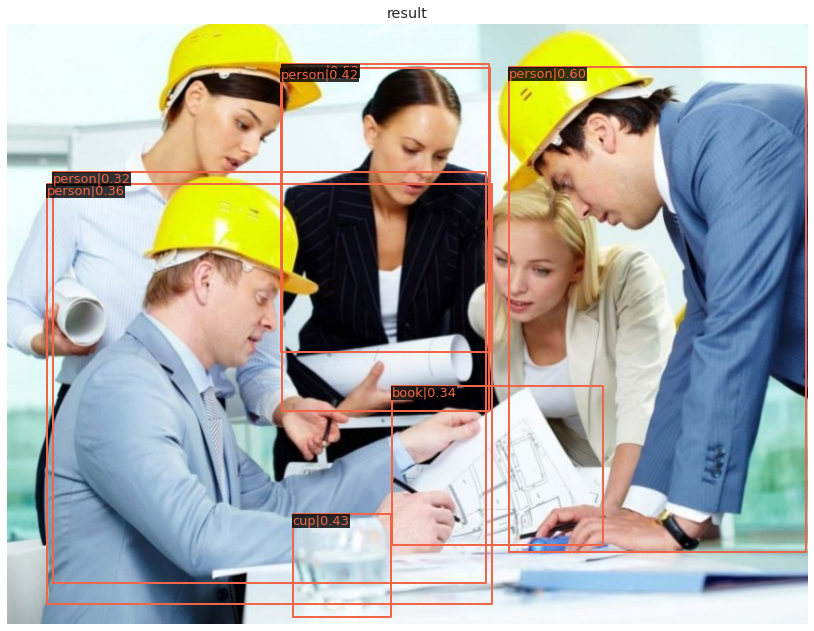

In [11]:
# Сделаем предсказание и визуализируем
img = '/content/demo_helmets.jpg'
result = inference_detector(model, img)
show_result_pyplot(model, img, result, score_thr=0.3)

In [13]:
# Посмотрим на общее количество предсказаний модели
for i, res in enumerate(result):
  if res.shape[0]:
    print(f'класс {i}, предсказаний {res.shape[0]}')

класс 0, предсказаний 37
класс 25, предсказаний 2
класс 26, предсказаний 1
класс 27, предсказаний 4
класс 29, предсказаний 1
класс 39, предсказаний 3
класс 40, предсказаний 3
класс 41, предсказаний 4
класс 42, предсказаний 2
класс 43, предсказаний 4
класс 44, предсказаний 2
класс 45, предсказаний 1
класс 56, предсказаний 6
класс 57, предсказаний 1
класс 60, предсказаний 10
класс 61, предсказаний 1
класс 63, предсказаний 3
класс 64, предсказаний 1
класс 65, предсказаний 1
класс 66, предсказаний 1
класс 67, предсказаний 5
класс 73, предсказаний 6
класс 76, предсказаний 1


  - Модель не очень уверена в своих оценках.
  - Не все люди предсказаны при заданном пороге уверенности.
  - Каски и голова не предсказываются.

### **3). Выбор датасета**

При работе с датасетом вы неизбежно столкнетесь с работой с файлами и папками (директориями). Рекомендуется освежить в памяти работу с библиотеками `os`, `json`, `glob`. Может помочь [этот туториал](https://realpython.com/working-with-files-in-python/).

На выбор предоставляются 5 датасетов по детекции объектов:
1. [Детекция игровых карт](https://github.com/EdjeElectronics/TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10): лежат в папке images вместе с разметкой;
2. [Детекция фруктов](https://www.kaggle.com/mbkinaci/fruit-images-for-object-detection): скачать можно, нажав на кнопку Download;
3. [Детекция одежды (Deep Fashion 2)](https://github.com/switchablenorms/DeepFashion2): стоит прочитать README на главной странице репозитория. Для получения датасета нужно запросить пароль у автора через гугл-форму. После скачивания распакуйте его с использованием пароля. Из файлов аннотаций нас будут интересовать только `bounding_box`, `category_name` и `category_id`;
4. [Детекция лиц (Wider Face)](http://shuoyang1213.me/WIDERFACE/): большой датасет для детектирования лиц самых разных размеров. Скачать можно прямо по ссылкам на сайте;
5. [Детекция лиц (Kaggle)](https://www.kaggle.com/dataturks/face-detection-in-images): в датасете достаточно мало данных, но можно попробовать, если датасеты выше показались неподходящими для Вас;
6. Датасет из любого соревновани по детекции на Kaggle.

> Результатом выполнения пункта явлется загруженный датасет, состоящий из изображений и разметки к ним (bounding box'ов всех объектов на каждом изображении).

Я выбрала датасет на Kaggle по [ссылке](https://www.kaggle.com/andrewmvd/hard-hat-detection). Он также доступен к скачиванию по этой [ссылке](https://makeml.app/datasets/hard-hat-workers). Датасет представляет из себя набор из 5000 изображений (и столько же файлов аннотаций), на которых изображены сцены со строительной площадки. Аннотация содержит разметку bounding boxes на 3 класса - Person, Head, Helmet. Я скачала его на свой GoogleDisk, оттуда по ссылке загрузим его и распакуем.

In [14]:
# Загрузим датасет
DATA = '/content/data/'
os.makedirs(DATA, exist_ok=True)
os.chdir(DATA)
!gdown --id 1ixE_3qItmBDsZYpPhBdsjqklXngUSdvN

Downloading...
From: https://drive.google.com/uc?id=1ixE_3qItmBDsZYpPhBdsjqklXngUSdvN
To: /content/data/helmet_dataset_pascal_voc.zip
1.31GB [00:11, 117MB/s]


In [15]:
%%time
#Разархивируем данные
!unzip -q {osp.join(DATA, 'helmet_dataset_pascal_voc.zip')} -d helmet_dataset

CPU times: user 96.8 ms, sys: 48.7 ms, total: 145 ms
Wall time: 14.2 s


In [16]:
# Посмотрим на структуру каталога
for address, dirs, files in os.walk(DATA):
  print(address, dirs, len(files))

/content/data/ ['helmet_dataset'] 1
/content/data/helmet_dataset ['annotations', 'images'] 0
/content/data/helmet_dataset/annotations [] 5000
/content/data/helmet_dataset/images [] 5000


In [17]:
# Запишем имена файлов изображений в список
DATA_IM = osp.join(DATA, 'helmet_dataset/images')
for address, dirs, files in os.walk(DATA_IM):
  lst_images = files

Посмотрим, как выглядят некоторые изображения

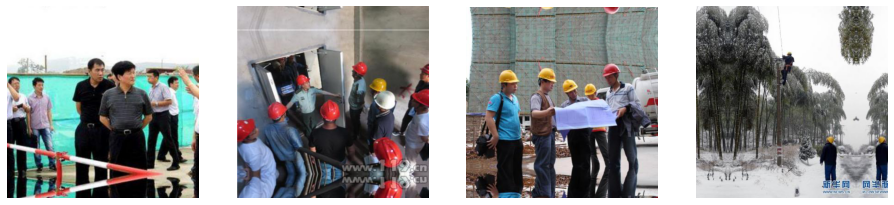

In [18]:
plt.figure(figsize=(24, 8))
for i in range(4):
  im = cv2.imread(osp.join(DATA_IM, lst_images[i+105]))
  im = im[:, :, [2, 1, 0]]
  plt.subplot(1, 6, i+1)
  plt.axis("off")
  plt.imshow(im)

Напишем функцию, которая отрисовывает истинные боксы по заданным номерам изображений.

In [19]:
def show_ground_truth(index, classes):  
  
    # path
    im = osp.join(DATA_IM, 'hard_hat_workers' + str(index) + '.png')
    if osp.isdir(osp.join(DATA, 'helmet_dataset/Annotations')):
      an = osp.join(DATA, 'helmet_dataset/Annotations/hard_hat_workers' + str(index) + '.xml')
    else:
      an = osp.join(DATA, 'helmet_dataset/annotations/hard_hat_workers' + str(index) + '.xml')
    
    # get_ann_info:    
    tree = ET.parse(an)
    root = tree.getroot()
    bboxes = []
    labels = []    
    for obj in root.findall('object'):
        name = obj.find('name').text
        if name not in classes:
            continue
        label = name      
        bnd_box = obj.find('bndbox')
        
        bbox = [
            int(float(bnd_box.find('xmin').text)),
            int(float(bnd_box.find('ymin').text)),
            int(float(bnd_box.find('xmax').text)),
            int(float(bnd_box.find('ymax').text))
        ]
                
        bboxes.append(bbox)
        labels.append(label)
    
    bboxes = np.array(bboxes, ndmin=2) - 1
    ann_label = np.array(labels)    
    ann_box = bboxes.astype(np.float32)    

    # plot
    bbox_color = 'red'
    text_color = 'yellow'

    img = mmcv.imread(im).astype(np.uint8)
    img = mmcv.bgr2rgb(img)
    img = np.ascontiguousarray(img)
    
    fig = plt.figure(figsize=(8,8), frameon=False)
    plt.title(str(index))
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    ax = plt.gca()
    ax.axis('off')

    polygons = []
    color = []

    for i, (bbox, label) in enumerate(zip(ann_box, ann_label)):
        bbox_int = bbox.astype(np.int32)
        poly = [[bbox_int[0], bbox_int[1]], [bbox_int[0], bbox_int[3]],
                [bbox_int[2], bbox_int[3]], [bbox_int[2], bbox_int[1]]]
        np_poly = np.array(poly).reshape((4, 2))
        polygons.append(Polygon(np_poly))
        color.append(bbox_color)
        label_text = label
        ax.text(
            bbox_int[0],
            bbox_int[1],
            f'{label_text}',
            bbox={
                'facecolor': 'black',
                'alpha': 0.8,
                'pad': 0.7,
                'edgecolor': 'none'
            },
            color=text_color,
            fontsize=12,
            verticalalignment='top',
            horizontalalignment='left') 

    plt.imshow(img)

    p = PatchCollection(
        polygons, facecolor='none', edgecolors=color, linewidths=2)
    ax.add_collection(p)
    img = mmcv.rgb2bgr(img)   

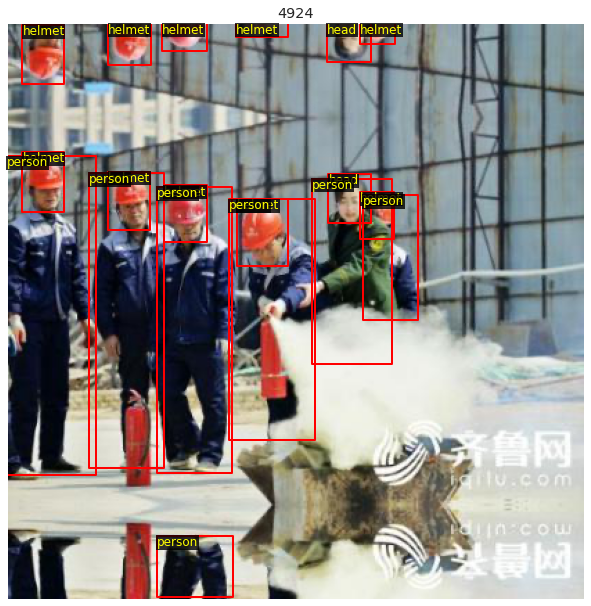

In [19]:
show_ground_truth(4924, ('person', 'head', 'helmet'))

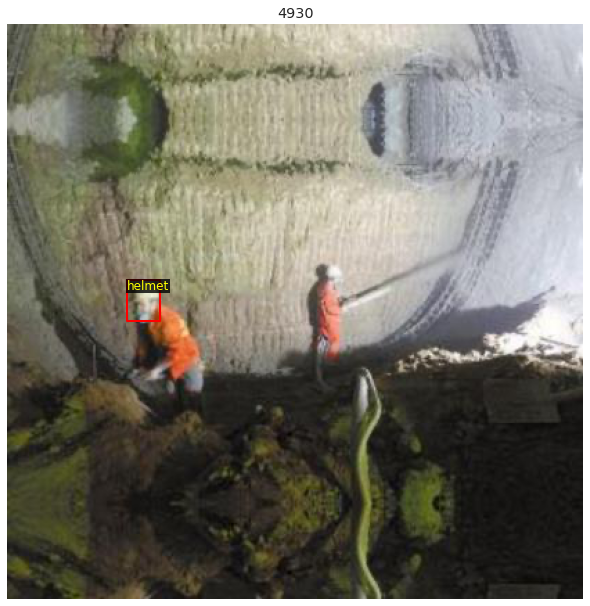

In [25]:
show_ground_truth(4930, ('person', 'head', 'helmet'))

Очевидно, что класс **helmet** - это каска, а класс **head** это голова без каски. А вот разметка на класс **person** вызывает вопросы. На некоторых изображениях присутствует разметка для людей, на некоторых отсутствует (это не зависит от того, является человек рабочим или относится, например, к административному персоналу).\
При обучении модели будем игнорировать класс **person**. Для целей данной работы достаточно будет определять, голова в каске или нет.



### **4). Предобработка данных**

Самый непростой этап в этом сценарии. Скачать данные $-$ лишь половина дела. Чтобы обучить нейросеть на этих данных, нужно написать генератор батчей. Однако если будем подавать изображения так, как они есть, то даже батч собрать не сможем -- нужно привести их к однмоу размеру. Далее нужно привести их к типу float, переместить на CUDA и поделить значения в пикселях на 255 (подробнее см. [занятие](https://www.youtube.com/watch?v=XSPYe4-y4HE)). Также нужно настроить аугментации и постобработку.

То, как именно все это реализовать $-$ зависит от инструмента, выбранного в пункте 1. Например, в detectron2 в обучающих материалах описан формат данных для обучения. Возможно, нужно будет зайти в документацию и почитать более подробно, чтобы разобраться, какой именно нужен формат координат.

НЕ нужно копировать все файлы с картинками и разметкой прямо на диске в их предобработанные версии. Хороший тон $-$ осуществлять всю эту обработку программно, "на лету". Поможет [туториал](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html) по написанию своего датасета на PyTorch.

> Результатом выполнения пункта явлется код, запуск которого ведет к подаче батчей правильного вида (разметка приведена к требуемому формату координат, изображения нужного типа, размера и поделены на 255 и т.д.) для обучения нейронной сети-детектора.

#### Подготовим текстовые документы со списком файлов для выборок: train, val, test.
Если нужно в точности воспроизвести обучение модели, то необходимо взять сохранненные файлы tr_ix.txt, val_ix.txt, ts_ix.txt из той же папки, где лежит ноутбук (положить в папку WORK_DIR, ниже будет код, который копирует оттуда эти файлы).

In [20]:
val_size = 1000
full_size = len(lst_images)

In [21]:
# Случайным образом выбираем индексы для каждой из выборок
lst_images = np.array([i[:-4] for i in lst_images])
ix = np.random.choice(len(lst_images), len(lst_images), replace=False)
tr, val, ts = np.split(ix, [full_size - 2 * val_size, full_size - val_size])
print(len(tr), len(val), len(ts))

3000 1000 1000


In [22]:
# Записываем имена файлов в тектовые документы
for ind, f_name in zip((tr, val, ts), ('tr', 'val', 'ts')):
  with open(osp.join(DATA, f_name + '_ix.txt'), 'w') as f:
    f.writelines("%s\n" % line for line in lst_images[ind])

Для обеспечения воспроизводимости результатов, сохраним полученные списки на диск, и при новом запуске ноутбука будем загружать эти файлы, а не создавать заново.

In [24]:
# Сохраним документы со списком файлов для обучения, валидации и теста на диск
for f_name in ('tr', 'val', 'ts'):
  shutil.copy(osp.join(DATA, f_name + '_ix.txt'),
              WORK_DIR)

#### В MMDetection уже прописана логика загрузки данных, их корректная предобработка, нормализация и аугментации. 
Основная задача - написать Class датасета и поменять конфигурацию для обучения модели. В этом разделе мы напишем Class, а в следующем изменим конфигурацию и пропишем путь к файлам

In [23]:
# переименуем папку annotations в Annotations, чтобы не переписывать весь класс, от которого мы будем наследоваться
os.rename(osp.join(DATA, 'helmet_dataset/annotations'), osp.join(DATA, 'helmet_dataset/Annotations'))

In [24]:
@DATASETS.register_module()
class HHDataset(XMLDataset):
  
  CLASSES = ('helmet', 'head')
  
  def load_annotations(self, ann_file):
      """Load annotation from XML style ann_file.        
          Args:
              ann_file (str): Path of XML file.        
          Returns:
              list[dict]: Annotation info from XML file.
      """      
      data_infos = []
      img_ids = mmcv.list_from_file(ann_file)      

      for img_id in img_ids:
          filename = f'images/{img_id}.png'          
          xml_path = osp.join(self.img_prefix, 'Annotations',
                                  f'{img_id}.xml')          
          tree = ET.parse(xml_path)
          root = tree.getroot()
          size = root.find('size')

          if size is not None:
              width = int(size.find('width').text)
              height = int(size.find('height').text)
          else:
              img_path = osp.join(self.img_prefix, 'images',
                                  f'{img_id}.png')              
              img = Image.open(img_path)
              width, height = img.size

          data_infos.append(dict(id=img_id, 
                                filename=filename, width=width, height=height))                  

      return data_infos      

### **5). Обучение модели-детектора** 

Стоит написать цикл обучения на PyTorch самостоятельно, однако допускается использовать [Catalyst](https://github.com/catalyst-team/catalyst), [PyTorch Lightning](https://github.com/williamFalcon/pytorch-lightning) или [Ignite](https://github.com/pytorch/ignite). Например, саму модель можно взять из фреймворка из пункта 1, а обучение осуществлять с помощью одной перечисленных трех библиотек.

> Результатом выполнения пункта явлется код, запуск которого ведет к обучению модели на выбранном датасете. При обучении **обязательно выводить числовые значения лосса на трейне и валидации**, крайне желательно использовать [`TensorBoard`](https://pytorch.org/docs/stable/tensorboard.html) для визуализации. Обязательно также сохранять модель после каждой N-ой эпохи, чтобы потом ее качество можно было проверить и веса были переиспользуемыми.

**UPD**\
Разрешено также использовать выбранный фреймворк, в том числе MMDetection.

#### Изменение конфигурации

Библиотека MMDetection позволяет быстро настроить параметры обучения и "доучить" выбранную модель на новом датасете. Для этого, необходимо поменять некоторые настройки конфигурации 

In [25]:
# Загрузим конфигурацию CenterNet
cfg = Config.fromfile('/content/mmdetection/configs/centernet/centernet_resnet18_dcnv2_140e_coco.py')

# Посмотрим на параметры:
print(f'Config:\n{cfg.pretty_text}')

Config:
dataset_type = 'CocoDataset'
data_root = 'data/coco/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile', to_float32=True, color_type='color'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='PhotoMetricDistortion',
        brightness_delta=32,
        contrast_range=(0.5, 1.5),
        saturation_range=(0.5, 1.5),
        hue_delta=18),
    dict(
        type='RandomCenterCropPad',
        crop_size=(512, 512),
        ratios=(0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3),
        mean=[0, 0, 0],
        std=[1, 1, 1],
        to_rgb=True,
        test_pad_mode=None),
    dict(type='Resize', img_scale=(512, 512), keep_ratio=True),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='DefaultFormatBundle'),
    dict(type

In [ ]:
# # Загрузим модель и веса (если не было выполнено ранее, то необходимо раскомментировать)
# !mkdir checkpoints

# !wget -c http://download.openmmlab.com/mmdetection/v2.0/centernet/centernet_resnet18_dcnv2_140e_coco/centernet_resnet18_dcnv2_140e_coco_20210520_101209-da388ba2.pth \
#       -O checkpoints/centernet_resnet18_dcnv2_140e_coco_20210520_101209-da388ba2.pth

mkdir: cannot create directory ‘checkpoints’: File exists
--2021-06-15 10:01:07--  http://download.openmmlab.com/mmdetection/v2.0/centernet/centernet_resnet18_dcnv2_140e_coco/centernet_resnet18_dcnv2_140e_coco_20210520_101209-da388ba2.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.254.186.225
Connecting to download.openmmlab.com (download.openmmlab.com)|47.254.186.225|:80... connected.
HTTP request sent, awaiting response... 200 OK

    The file is already fully retrieved; nothing to do.



Поменяем конфигурацию для обучения на новом датасете

In [26]:
# Загрузим файлы со списками имен изображений для обучения, валидации и тестирования
for f_name in ('tr', 'val', 'ts'):
  shutil.copy(osp.join(WORK_DIR, f_name + '_ix.txt'),
              DATA)

In [27]:
# Установим seed для воспроизводимости результатов
cfg.seed = 1
set_random_seed(1, deterministic=False)

# Поменяем типа датасета и путь к нему
cfg.dataset_type = 'HHDataset'
cfg.data_root = DATA

# train
cfg.data.train.type = 'HHDataset'
cfg.data.train.data_root = DATA
cfg.data.train.ann_file = 'tr_ix.txt'
cfg.data.train.img_prefix = 'helmet_dataset/'

# val
cfg.data.val.type = 'HHDataset'
cfg.data.val.data_root = DATA
cfg.data.val.ann_file = 'val_ix.txt'
cfg.data.val.img_prefix = 'helmet_dataset/'

# test
cfg.data.test.type = 'HHDataset'
cfg.data.test.data_root = DATA
cfg.data.test.ann_file = 'ts_ix.txt'
cfg.data.test.img_prefix = 'helmet_dataset/'

# Поменяем количество классов и чек-поинт
cfg.model.bbox_head.num_classes = 2
cfg.load_from = '/content/checkpoints/centernet_resnet18_dcnv2_140e_coco_20210520_101209-da388ba2.pth'

# Папка для сохранения логов и весов модели(сохраняется на Google Disk)
cfg.work_dir = M_LOGS

# Параметры оптимизатора
# CenterNet обучена на 8 GPU, поэтому разделим исходные значения на 8
cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup_ratio = 0.0001 
cfg.lr_config.policy = 'step'

# Параметры логирования
cfg.log_config.interval = 20
cfg.log_config.hooks=[dict(type='TensorboardLoggerHook'),
                      dict(type='TextLoggerHook')]

# Параметры валидации
cfg.evaluation.metric = 'mAP'
cfg.evaluation.interval = 10
cfg.checkpoint_config.interval = 10

# Размер батчей и количество эпох
cfg.data.samples_per_gpu = 50 
cfg.data.workers_per_gpu = 1
cfg.runner.max_epochs = 50

# установим 1 ГПУ
cfg.gpu_ids = range(1)

# Посмотрим на новую конфигурацию
print(f'Config:\n{cfg.pretty_text}')

Config:
dataset_type = 'HHDataset'
data_root = '/content/data/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile', to_float32=True, color_type='color'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='PhotoMetricDistortion',
        brightness_delta=32,
        contrast_range=(0.5, 1.5),
        saturation_range=(0.5, 1.5),
        hue_delta=18),
    dict(
        type='RandomCenterCropPad',
        crop_size=(512, 512),
        ratios=(0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3),
        mean=[0, 0, 0],
        std=[1, 1, 1],
        to_rgb=True,
        test_pad_mode=None),
    dict(type='Resize', img_scale=(512, 512), keep_ratio=True),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='DefaultFormatBundle'),
    dict(ty

#### Обучение детектора

In [219]:
# Соберем датасет для обучения (валидационный датасет собирается в функции train_detector)
datasets = [build_dataset(cfg.data.train)]

# Построим детектор на основе конфигурации, которую мы изменили
model = build_detector(cfg.model)

# Укажем список классов для модели
model.CLASSES = ('helmet', 'head')

# Зададим папку для хранения логов и чек-поинтов
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))

# Запустим тренировку детектора
train_detector(model, datasets, cfg, distributed=False, validate=True)

/content/mmdetection/mmdet/models/detectors/single_stage.py:28: UserWarning: DeprecationWarning: pretrained is deprecated, please use "init_cfg" instead
  warnings.warn('DeprecationWarning: pretrained is deprecated, '
/content/mmdetection/mmdet/models/backbones/resnet.py:400: UserWarning: DeprecationWarning: pretrained is deprecated, please use "init_cfg" instead
  warnings.warn('DeprecationWarning: pretrained is deprecated, '
2021-06-16 16:18:46,465 - mmdet - INFO - load checkpoint from /content/checkpoints/centernet_resnet18_dcnv2_140e_coco_20210520_101209-da388ba2.pth
2021-06-16 16:18:46,466 - mmdet - INFO - Use load_from_local loader
2021-06-16 16:18:46,522 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for bbox_head.heatmap_head.2.weight: copying a param with shape torch.Size([80, 64, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 64, 1, 1]).
size mismatch for bbox_head.heatmap_head.2.bias: copying a param with shape t

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1000/1000, 53.5 task/s, elapsed: 19s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-16 16:35:43,076 - mmdet - INFO - 
+--------+------+-------+--------+-------+
| class  | gts  | dets  | recall | ap    |
+--------+------+-------+--------+-------+
| helmet | 3707 | 64067 | 0.886  | 0.824 |
| head   | 1034 | 35933 | 0.858  | 0.760 |
+--------+------+-------+--------+-------+
| mAP    |      |       |        | 0.792 |
+--------+------+-------+--------+-------+
2021-06-16 16:35:43,086 - mmdet - INFO - Saving checkpoint at 10 epochs
2021-06-16 16:35:43,643 - mmdet - INFO - Epoch(val) [10][1000]	AP50: 0.7920, mAP: 0.7924
2021-06-16 16:36:18,650 - mmdet - INFO - Epoch [11][20/61]	lr: 1.573e-03, eta: 1:04:59, time: 1.749, data_time: 0.235, memory: 7732, loss_center_heatmap: 0.8449, loss_wh: 0.0994, loss_offset: 0.2137, loss: 1.1581, grad_norm: 2.8780
2021-06-16 16:36:50,066 - mmdet - INFO - Epoch [11][40/61]	lr: 1.623e-03, eta: 1:04:24, time: 1.571, data_time: 0.064, memory: 7732, loss_center_heatmap: 0.8391, loss_wh: 0.0955, loss_offset: 0.2105, loss: 1.1451, grad_no

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1000/1000, 58.4 task/s, elapsed: 17s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-16 16:52:35,473 - mmdet - INFO - 
+--------+------+-------+--------+-------+
| class  | gts  | dets  | recall | ap    |
+--------+------+-------+--------+-------+
| helmet | 3707 | 64178 | 0.896  | 0.852 |
| head   | 1034 | 35822 | 0.877  | 0.796 |
+--------+------+-------+--------+-------+
| mAP    |      |       |        | 0.824 |
+--------+------+-------+--------+-------+
2021-06-16 16:52:35,483 - mmdet - INFO - Saving checkpoint at 20 epochs
2021-06-16 16:52:36,027 - mmdet - INFO - Epoch(val) [20][1000]	AP50: 0.8240, mAP: 0.8238
2021-06-16 16:53:11,193 - mmdet - INFO - Epoch [21][20/61]	lr: 2.500e-03, eta: 0:48:31, time: 1.757, data_time: 0.233, memory: 7732, loss_center_heatmap: 0.7151, loss_wh: 0.0852, loss_offset: 0.2090, loss: 1.0093, grad_norm: 2.5956
2021-06-16 16:53:42,881 - mmdet - INFO - Epoch [21][40/61]	lr: 2.500e-03, eta: 0:47:58, time: 1.584, data_time: 0.070, memory: 7732, loss_center_heatmap: 0.7344, loss_wh: 0.0871, loss_offset: 0.2063, loss: 1.0277, grad_no

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1000/1000, 58.5 task/s, elapsed: 17s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-16 17:09:26,282 - mmdet - INFO - 
+--------+------+-------+--------+-------+
| class  | gts  | dets  | recall | ap    |
+--------+------+-------+--------+-------+
| helmet | 3707 | 62502 | 0.901  | 0.865 |
| head   | 1034 | 37498 | 0.881  | 0.802 |
+--------+------+-------+--------+-------+
| mAP    |      |       |        | 0.834 |
+--------+------+-------+--------+-------+
2021-06-16 17:09:26,291 - mmdet - INFO - Saving checkpoint at 30 epochs
2021-06-16 17:09:26,858 - mmdet - INFO - Epoch(val) [30][1000]	AP50: 0.8340, mAP: 0.8335
2021-06-16 17:10:01,645 - mmdet - INFO - Epoch [31][20/61]	lr: 2.500e-03, eta: 0:32:07, time: 1.738, data_time: 0.234, memory: 7732, loss_center_heatmap: 0.6514, loss_wh: 0.0835, loss_offset: 0.2027, loss: 0.9375, grad_norm: 2.8537
2021-06-16 17:10:33,360 - mmdet - INFO - Epoch [31][40/61]	lr: 2.500e-03, eta: 0:31:34, time: 1.586, data_time: 0.067, memory: 7732, loss_center_heatmap: 0.6812, loss_wh: 0.0844, loss_offset: 0.2050, loss: 0.9706, grad_no

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1000/1000, 58.1 task/s, elapsed: 17s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-16 17:26:17,714 - mmdet - INFO - 
+--------+------+-------+--------+-------+
| class  | gts  | dets  | recall | ap    |
+--------+------+-------+--------+-------+
| helmet | 3707 | 63763 | 0.908  | 0.873 |
| head   | 1034 | 36237 | 0.878  | 0.805 |
+--------+------+-------+--------+-------+
| mAP    |      |       |        | 0.839 |
+--------+------+-------+--------+-------+
2021-06-16 17:26:17,723 - mmdet - INFO - Saving checkpoint at 40 epochs
2021-06-16 17:26:18,248 - mmdet - INFO - Epoch(val) [40][1000]	AP50: 0.8390, mAP: 0.8389
2021-06-16 17:26:53,151 - mmdet - INFO - Epoch [41][20/61]	lr: 2.500e-03, eta: 0:15:47, time: 1.744, data_time: 0.231, memory: 7732, loss_center_heatmap: 0.6354, loss_wh: 0.0795, loss_offset: 0.1992, loss: 0.9141, grad_norm: 2.6243
2021-06-16 17:27:24,551 - mmdet - INFO - Epoch [41][40/61]	lr: 2.500e-03, eta: 0:15:14, time: 1.570, data_time: 0.070, memory: 7732, loss_center_heatmap: 0.6394, loss_wh: 0.0818, loss_offset: 0.1996, loss: 0.9208, grad_no

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1000/1000, 56.5 task/s, elapsed: 18s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-16 17:43:09,711 - mmdet - INFO - 
+--------+------+-------+--------+-------+
| class  | gts  | dets  | recall | ap    |
+--------+------+-------+--------+-------+
| helmet | 3707 | 65919 | 0.907  | 0.874 |
| head   | 1034 | 34081 | 0.875  | 0.796 |
+--------+------+-------+--------+-------+
| mAP    |      |       |        | 0.835 |
+--------+------+-------+--------+-------+
2021-06-16 17:43:09,720 - mmdet - INFO - Saving checkpoint at 50 epochs
2021-06-16 17:43:10,271 - mmdet - INFO - Epoch(val) [50][1000]	AP50: 0.8350, mAP: 0.8350


In [220]:
# Запустим Tensorboard
tf_dir = M_LOGS + 'tf_logs/'

%load_ext tensorboard
%tensorboard --logdir {tf_dir}

Output hidden; open in https://colab.research.google.com to view.

In [221]:
# Запишем конфигурацию в файл
fname = osp.join(M_LOGS, 'HHCenterNet.py')
cfg.dump(fname)

#### Проверка результатов обучения на случайном изображении

Use load_from_local loader


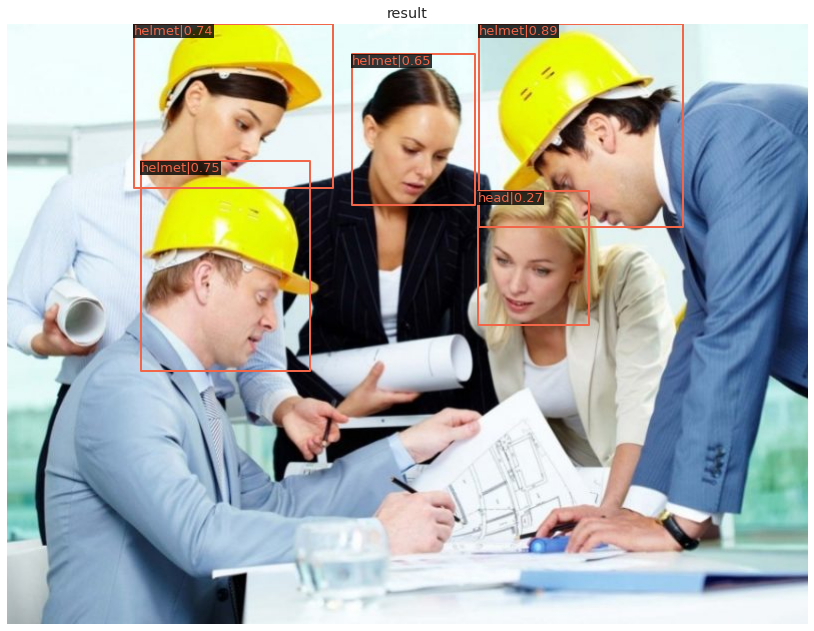

In [28]:
# Соберем модель
fname = osp.join(M_LOGS, 'HHCenterNet.py')
checkpoint = osp.join(M_LOGS, 'latest.pth')

helmet_model = init_detector(fname, checkpoint, device='cuda:0')
img = '/content/demo_helmets.jpg'

# Сделаем предсказание и визуализируем
result = inference_detector(helmet_model, img)
show_result_pyplot(helmet_model, img, result, score_thr=0.25)

Теперь модель уверенно определяет каски. Но все таки не очень уверенно определяет головы, иногда путая с касками.

In [29]:
print('Общее количество детекций модели')
for i, res in enumerate(result):
  cl = helmet_model.CLASSES
  if res.shape[0]:
    print(f'класс {cl[i]}, предсказаний {res.shape[0]}')

Общее количество детекций модели
класс helmet, предсказаний 65
класс head, предсказаний 35


Сравним предсказание модели с разметкой. \
Напишем функцию, которая будет визуализировать изображения с истинной разметкой и с предсказанной.

In [103]:
def show_predict(index, model, score_thr=0.25):  
  
    # path
    im = osp.join(DATA_IM, 'hard_hat_workers' + str(index) + '.png')
    if osp.isdir(osp.join(DATA, 'helmet_dataset/Annotations')):
      an = osp.join(DATA, 'helmet_dataset/Annotations/hard_hat_workers' + str(index) + '.xml')
    else:
      an = osp.join(DATA, 'helmet_dataset/annotations/hard_hat_workers' + str(index) + '.xml')

    classes = model.CLASSES
    
    # get_ann_info:    
    tree = ET.parse(an)
    root = tree.getroot()
    bboxes = []
    labels = []    
    for obj in root.findall('object'):
        name = obj.find('name').text
        if name not in classes:
            continue
        label = name      
        bnd_box = obj.find('bndbox')
        
        bbox = [
            int(float(bnd_box.find('xmin').text)),
            int(float(bnd_box.find('ymin').text)),
            int(float(bnd_box.find('xmax').text)),
            int(float(bnd_box.find('ymax').text))
        ]
                
        bboxes.append(bbox)
        labels.append(label)
    
    bboxes = np.array(bboxes, ndmin=2) - 1
    ann_label = np.array(labels)    
    ann_box = bboxes.astype(np.float32)    

    # plot
    bbox_color = 'red'
    text_color = 'yellow'

    img = mmcv.imread(im).astype(np.uint8)
    img = mmcv.bgr2rgb(img)
    img = np.ascontiguousarray(img)
    
    plt.figure(figsize=(18,8), frameon=False) 

    # ---- Ground truth
    plt.subplot(1,2,1)
    plt.title('Ground truth')
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    ax = plt.gca()
    ax.axis('off')

    polygons = []
    color = []

    for i, (bbox, label) in enumerate(zip(ann_box, ann_label)):
        bbox_int = bbox.astype(np.int32)
        poly = [[bbox_int[0], bbox_int[1]], [bbox_int[0], bbox_int[3]],
                [bbox_int[2], bbox_int[3]], [bbox_int[2], bbox_int[1]]]
        np_poly = np.array(poly).reshape((4, 2))
        polygons.append(Polygon(np_poly))
        color.append(bbox_color)
        label_text = label
        ax.text(
            bbox_int[0],
            bbox_int[1],
            f'{label_text}',
            bbox={
                'facecolor': 'black',
                'alpha': 0.8,
                'pad': 0.7,
                'edgecolor': 'none'
            },
            color=text_color,
            fontsize=12,
            verticalalignment='top',
            horizontalalignment='left') 

    plt.imshow(img)

    p = PatchCollection(
        polygons, facecolor='none', edgecolors=color, linewidths=2)
    ax.add_collection(p)    

    # ---- Predictions
    plt.subplot(1,2,2)
    plt.title('Predictions')    
    plt.subplots_adjust(left=1, right=2, bottom=1, top=2)
    ax = plt.gca()
    ax.axis('off')
    
    result = inference_detector(model, im)
    
    # get result info
    bboxes = []
    labels = []
    for i, label in enumerate(classes):
      for j in range(len(result[i])):
        if result[i][j][4] > 0.25:
          bboxes.append(result[i][j][:4])
          labels.append(label)

    bboxes = np.array(bboxes, ndmin=2) - 1
    labels = np.array(labels)

    bbox_color = 'magenta'
    text_color = 'yellow'

    polygons = []
    color = []    

    for i, (bbox, label) in enumerate(zip(bboxes, labels)):
        bbox_int = bbox.astype(np.int32)
        poly = [[bbox_int[0], bbox_int[1]], [bbox_int[0], bbox_int[3]],
                [bbox_int[2], bbox_int[3]], [bbox_int[2], bbox_int[1]]]
        np_poly = np.array(poly).reshape((4, 2))
        polygons.append(Polygon(np_poly))
        color.append(bbox_color)
        label_text = label
        ax.text(
            bbox_int[0],
            bbox_int[1],
            f'{label_text}',
            bbox={
                'facecolor': 'black',
                'alpha': 0.8,
                'pad': 0.7,
                'edgecolor': 'none'
            },
            color=text_color,
            fontsize=12,
            verticalalignment='top',
            horizontalalignment='left') 

    plt.imshow(img)
    p = PatchCollection(
        polygons, facecolor='none', edgecolors=color, linewidths=2)
    ax.add_collection(p)
    img = mmcv.rgb2bgr(img)

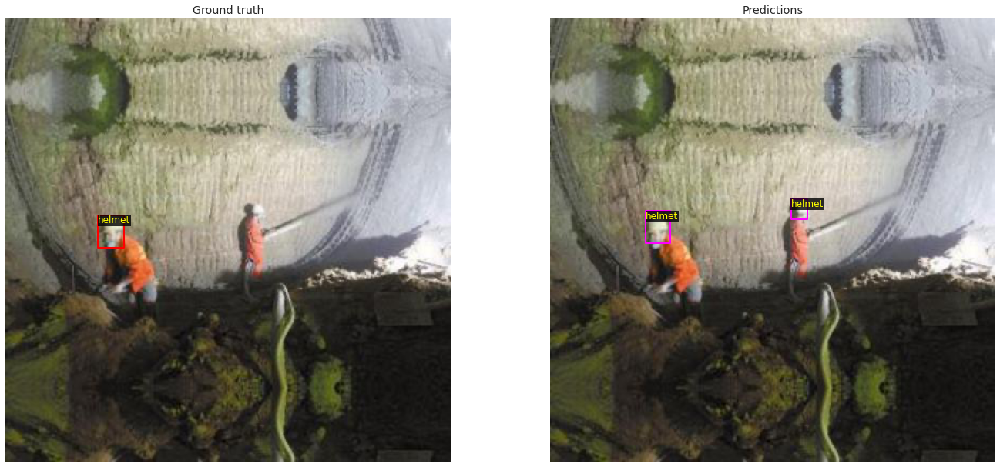

In [115]:
show_predict(4930, helmet_model, score_thr=0.3)

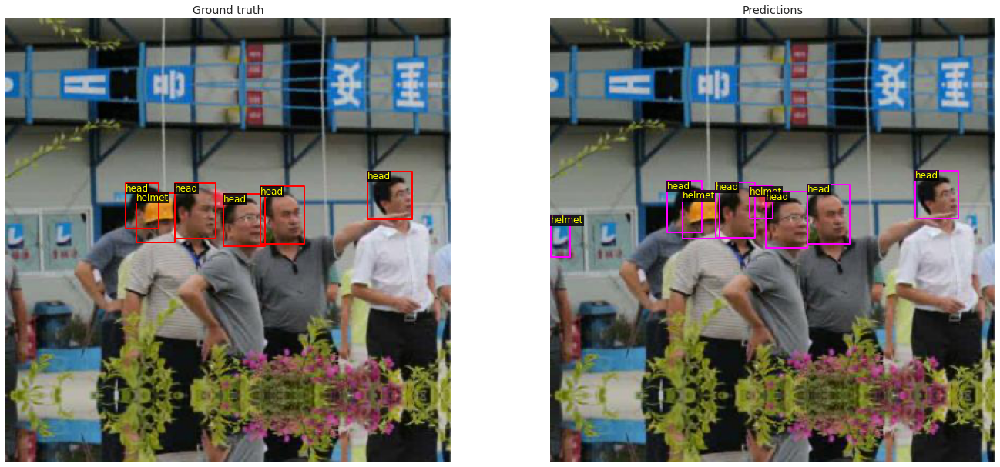

In [114]:
show_predict(3914, helmet_model, score_thr=0.3) # index from ts_ix.txt

### **6). Измерение качества работы модели (метрики согласуются с руководителем и зависят от задачи)**

Под метриками понимаются функции/формулы, по которым оценивается качество модели-детектора. Обычно для измерения качества работы детектора используют поклассовые Precision, Recall, F1-меру и mean Average Precision (mAP). Подробнее про них можно послушать в [видеолекции 2018 года](https://www.youtube.com/watch?v=ewkSI2cuyoQ&list=PL0Ks75aof3ThkitsZbUOEQg7Ybl5kB_s3&index=24).

Необходимо самостоятельно реализовать функции, вычисляющие поклассовые Precision и Recall. На вход функциям поступают веса модели и выборка, на которой нужно измерить метрики. На выходе $-$ таблица с precision и recall для каждого класса.

> Результат пункта $-$ реализованные функции метрик для задачи детектирования, позволяющие оценить качество работы модели на выборке. Выборка/даталоадер является аргументом функций.

#### Получение предсказаний на выбранном датасете

In [116]:
# Укажем путь к файлу конфигурации модели и ее последним весам
f_conf = osp.join(M_LOGS, 'HHCenterNet.py')
checkpoint = osp.join(M_LOGS, 'latest.pth')

Напишем функцию, которая собирает модель и делает предсказания по датасету, указанному в кофигурации.\
В зависимости от выборанного mode (train, val, test) можно получить предсказания на любом датасете.

In [117]:
def prediction(conf_file, checkpoint, mode='test'):
    # ----Соберем модель
    model = init_detector(conf_file, checkpoint, device='cuda:0')

    # ----Откроем конфигурацию для удобства доступа
    conf = Config.fromfile(conf_file)

    # ----Чтобы получить все предсказания в одном массиве используем MMDataParallel
    detmodel = MMDataParallel(
              model.cuda(conf.gpu_ids[0]), 
              device_ids=conf.gpu_ids
              )

    # ----Соберем датасет
    if mode == 'test':
      d_set = build_dataset(conf.data.test, dict(test_mode=True))

    elif mode == 'val':
      d_set = build_dataset(conf.data.val, dict(test_mode=True))

    elif mode == 'train':
      d_set = build_dataset(conf.data.train, dict(test_mode=True))

    # ----Соберем dataloader
    loader =  build_dataloader(
              d_set,
              conf.data.samples_per_gpu,
              conf.data.workers_per_gpu,            
              dist=False,
              shuffle=False)
    
    # ----Получим предсказания модели
    model.eval()
    results = []

    for i, data in enumerate(loader):
        with torch.no_grad():
            result = detmodel(return_loss=False, rescale=True, **data)
        
        results.extend(result)
    
    # ----Запишем предсказания модели
    with open(osp.join(WORK_DIR, mode + '_predictions.pickle'), 'wb') as f:
        pickle.dump(results, f)

    return results, d_set

Получим датасет и предсказания модели на тестовой выборке

In [118]:
results, d_set = prediction(f_conf, checkpoint, mode='test')  

Use load_from_local loader


#### Расчет метрик

Датасет MMDetection располагает функцией для расчета метрик. Вызовем ее и получим предсказания для различных порогов IoU.\
На вход функция принимает предсказания модели и пороги IoU. Вызывается от датасета.

In [119]:
 mean_ap = d_set.evaluate(
              results,              
              iou_thr=[0.1, 0.25, 0.5]
              )


---------------iou_thr: 0.1---------------

+--------+------+-------+--------+-------+
| class  | gts  | dets  | recall | ap    |
+--------+------+-------+--------+-------+
| helmet | 3725 | 61724 | 0.986  | 0.952 |
| head   | 1210 | 38276 | 0.976  | 0.887 |
+--------+------+-------+--------+-------+
| mAP    |      |       |        | 0.920 |
+--------+------+-------+--------+-------+

---------------iou_thr: 0.25---------------

+--------+------+-------+--------+-------+
| class  | gts  | dets  | recall | ap    |
+--------+------+-------+--------+-------+
| helmet | 3725 | 61724 | 0.980  | 0.948 |
| head   | 1210 | 38276 | 0.964  | 0.878 |
+--------+------+-------+--------+-------+
| mAP    |      |       |        | 0.913 |
+--------+------+-------+--------+-------+

---------------iou_thr: 0.5---------------

+--------+------+-------+--------+-------+
| class  | gts  | dets  | recall | ap    |
+--------+------+-------+--------+-------+
| helmet | 3725 | 61724 | 0.923  | 0.890 |
| he

Также, будет интересно посмотреть на графики Recall и Average Precision в зависимости от порога IoU.

In [120]:
# Функция по построению графиков метрик recall и ap по порогу IoU
def plot_ap(results, dataset):
  
  classes =  dataset.CLASSES
  annotations = [dataset.get_ann_info(i) for i in range(len(dataset))]

  rec_0 = []
  rec_1 = []
  ap_0 = []
  ap_1 = []
  
  for thr in np.linspace(0.05, 1, 20):
    mean_ap, eval_results = eval_map(results, 
                                     annotations, 
                                     iou_thr=thr
                                     )
    clear_output()

    rec_0.append(eval_results[0]['recall'][-1])
    rec_1.append(eval_results[1]['recall'][-1])
    ap_0.append(eval_results[0]['ap'])
    ap_1.append(eval_results[1]['ap'])

  
  plt.figure(figsize=(18,8))

  plt.subplot(1,2,1)
  plt.plot(np.linspace(0.05, 1, 20), rec_0, label = str(classes[0]))
  plt.plot(np.linspace(0.05, 1, 20), rec_1, label = str(classes[1]))
  plt.legend(loc='best')
  plt.xlabel('IoU')
  plt.ylabel('Recall')
  plt.title('Recalls per classes')

  plt.subplot(1,2,2)
  plt.plot(np.linspace(0.05, 1, 20), ap_0, label = str(classes[0]))
  plt.plot(np.linspace(0.05, 1, 20), ap_1, label = str(classes[1]))
  plt.legend(loc='best')
  plt.xlabel('IoU')
  plt.ylabel('Average Precision')
  plt.title('AP per classes')

  plt.show()

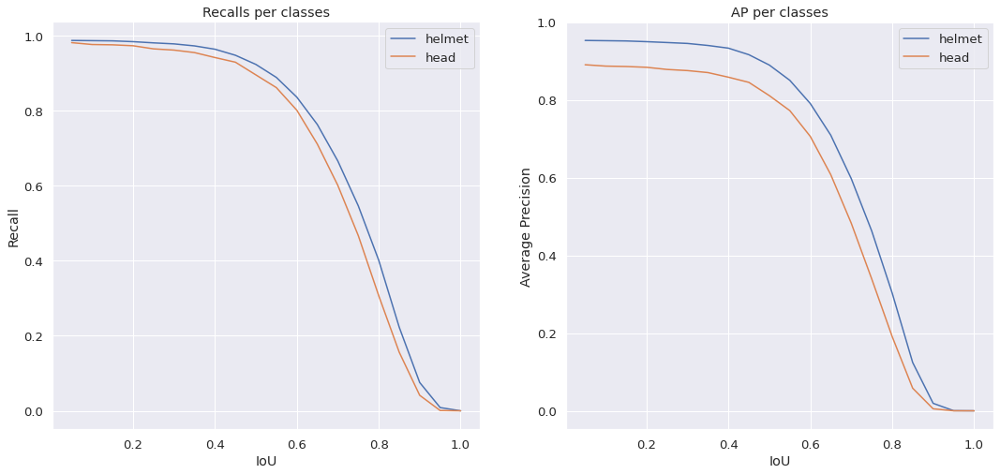

In [121]:
plot_ap(results, d_set)

Судя по метрикам, модель более уверенно предсказывает каски, чем головы без касок

### **7). Поиск путей применения этой модели в бизнесе/реальных задачах/набросок встраивания в веб/мобильное демо**
 
В этом пункте нужно подумать, как эта модель может быть использована в дальнейшем. То есть, например, зачем нужно детектировать фрукты? Или одежду?

> Результат пункта $-$ перечисленные кейсы использования модели (описанные **как можно подробнее**).

**IMPORTANT NOTE:** Обычно этим вопросом все же задаются до начала какой-либо разработки. Просто в данном случае проект выполняется скорее в образовательных целях.

Я задалась вопросом дальнейшего использования обученной модели до того, как начала работу, поэтому выбор датасета не случаен.

По нормам ОТиТБ (Охраны труда и Техники безопасности) ношение касок является обязательным для всех людей, находящихся на территории строительной площадки [СНиП 12-03-2001](https://docs.cntd.ru/document/901794520).\
По личному опыту мне известно, что это требование часто нарушается. \
Контроль за соблюдением норм по безопасности труда возлагается на ответственного, а со штрафами и последствиями халатного отношения приходится иметь дело юридическому лицу (Застройщику, Генпорядчику и т.д.).\
На мой взгляд, будет очень полезным, иметь инструмент, который в режиме реального времени по видео детектирует людей без касок на объекте. Это позволит снизить:
- нагрузку на ответственного за обеспечение безопасности труда на строительной прощадке.
- вероятность наложения штрафов контролирующих органов.
- риск получения травм при производстве работ.

Я вижу 3 варианта возможного применения обученной модели:
- сделать веб-интерфейс, где в режиме реального времени модель будет осуществлять детекцию по камерам наблюдения.
- создать мобильное приложение, которое будет присылать push-уведомления ответственным лицам при обнаружении человека без каски на объекте.
- запускать дронов для осуществления видеосъемки строительной площадки и детекции людей без касок.

Для реализации любого из этих сценариев обученная мной модель CenterNet подходит. Она достаточно легкая в сравнении с другими моделями для детекции (файл словаря CenterNet, загруженный из MMDetection, весил всего 58 Мб, а, например, PointRend 240 Мб). Модель уже после 50 эпох обучения показызывает хорошую точность предсказаний (mAP = 0.85 при пороге уверенности 0.5).
Однако, требуется провести дополнительные работы по запуску модели в production:
- обучить модель на датасете с корректной разметкой. Датасет, используемый для обучения, содержит досадные ошибки (в том числе отсутствие разметки там, где она необходима).
- решить задачу трекинга, о которой можно прочитать в прекрасной [статье](https://habr.com/ru/company/mipt/blog/458190/) Ильи Захаркина.
- упаковать модель в контейнер.
- разработать ПО для использования модели.

### <h2 style="text-align: center;"><b>Критерии оценивания</b></h2>

* 1 пункт $-$ 1 балл 
* 2 пункт $-$ 1 балл 
* 3 пункт $-$ 0 баллов (промежуточный пункт)  
* 4 пункт $-$ 3 балла   
* 5 пункт $-$ 3 балла   
* 6 пункт $-$ 1 балл 
* 7 пункт $-$ 1 балл 
* Максимум баллов по проекту $-$ 10  

**Успехов в выполнении проекта!** 

Желаю всем проделать полезную, интересную и качественную работу, которую потом нестыдно и в резюме указать, и друзьям показать ;)